This notebook illustrates using clustering and our descriptors compounds.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer



import warnings
warnings.filterwarnings("ignore")

In [4]:
# import data
data = pd.read_csv("../../../data/processed/drug_bank_clean.csv")

In [5]:
data.head(2)

,Name,SMILES,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,...,MW,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb
0,Bivalirudin,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(O)=O)NC(=O)[C@...,-5.0931,25.939668,534.3813,317.363434,6,18,18,293,...,2180.289181,306.516036,1.977523,153.54308,82.176355,71.366725,286334.0,230.0,-8.623,752.0
1,Leuprolide,CCNC(=O)[C@@H]1CCCN1C(=O)[C@H](CCCNC(N)=N)NC(=...,0.4325,0.187056,317.0896,187.074612,0,20,21,171,...,1209.400552,174.200943,2.002310,78.03037,30.548034,47.482336,46759.0,130.0,1.134,436.0


In [6]:
# getting all descriptors except compound name
without_compound = data.drop(['Name','SMILES'], axis=1)
without_compound.head(2)

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,MW,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb
0,-5.0931,25.939668,534.3813,317.363434,6,18,18,293,5.125258,-2.388694,...,2180.289181,306.516036,1.977523,153.54308,82.176355,71.366725,286334.0,230.0,-8.623,752.0
1,0.4325,0.187056,317.0896,187.074612,0,20,21,171,2.269431,-1.093604,...,1209.400552,174.200943,2.002310,78.03037,30.548034,47.482336,46759.0,130.0,1.134,436.0


In [7]:
# scaling our data by using standard scaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(without_compound)

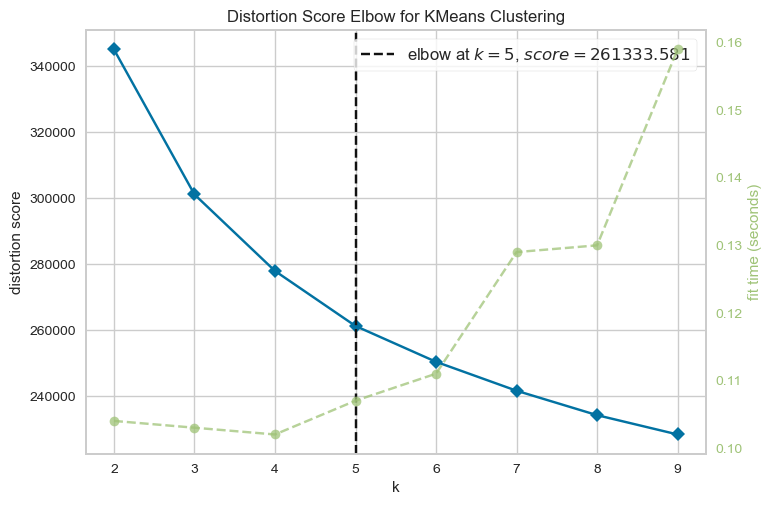

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [8]:
# Instantiate the KMeans model
kmeans_model = KMeans()

# Instantiate the KElbowVisualizer
elbow_visualizer = KElbowVisualizer(kmeans_model, k=(2, 10))

# Fit the visualizer to the data
elbow_visualizer.fit(X_scaled)

# Visualize the elbow plot
elbow_visualizer.show()

In [36]:
sns.set()

Cluster 2 Sillhoute Score 0.5834159976927242
Cluster 3 Sillhoute Score 0.4619443890753173
Cluster 4 Sillhoute Score 0.3260162289955886
Cluster 5 Sillhoute Score 0.3375511220996368
Cluster 6 Sillhoute Score 0.22889785175640734
Cluster 7 Sillhoute Score 0.2179995116659977
Cluster 8 Sillhoute Score 0.19405851201962937
Cluster 9 Sillhoute Score 0.18827055457714917
Cluster 10 Sillhoute Score 0.19000213056913812
Cluster 11 Sillhoute Score 0.08623036110180443
Cluster 12 Sillhoute Score 0.10108716322128757
Cluster 13 Sillhoute Score 0.06277159205146708
Cluster 14 Sillhoute Score 0.01811190398429743
Cluster 15 Sillhoute Score 0.059182994555299
Cluster 16 Sillhoute Score -0.06234871662307226
Cluster 17 Sillhoute Score 0.07262932898934762
Cluster 18 Sillhoute Score -0.014300273482830523
Cluster 19 Sillhoute Score -0.006581185234594802


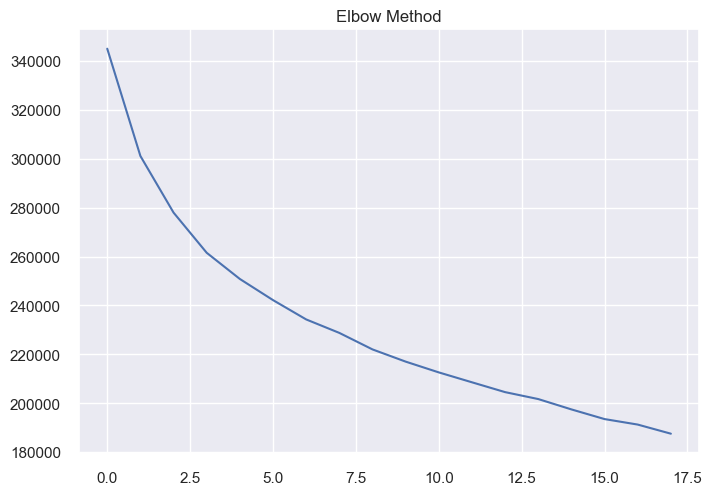

In [37]:
# elbow method
n_clusters = 20
cost = []
for i in range(2, n_clusters):
    kmean= KMeans(i, n_init=10, max_iter=1000)
    kmean.fit(X_scaled)
    labels = kmean.labels_
    
    cost.append(kmean.inertia_)
    print("Cluster {} Sillhoute Score {}".format(i, silhouette_score(without_compound, labels)))  

plt.title("Elbow Method")
plt.plot(cost, 'bx-');

In [38]:
kmean = KMeans(4, n_init=10, max_iter=1000)
kmean.fit(X_scaled)
labels = kmean.labels_

In [39]:
# adding clusters to our data
clusters = pd.concat([without_compound, pd.DataFrame({'cluster': labels})], axis=1)
clusters.head()

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,cluster
0,-5.0931,25.939668,534.3813,317.363434,6,18,18,293,5.125258,-2.388694,...,306.516036,1.977523,153.543080,82.176355,71.366725,286334.0,230.0,-8.623,752.0,3
1,0.4325,0.187056,317.0896,187.074612,0,20,21,171,2.269431,-1.093604,...,174.200943,2.002310,78.030370,30.548034,47.482336,46759.0,130.0,1.134,436.0,3
2,-1.8743,3.513000,325.6625,190.878612,0,20,21,175,2.635543,-1.251529,...,181.809125,1.997902,88.729976,35.878826,52.851150,52357.0,134.0,-2.012,458.0,3
3,9.1843,84.351366,493.8733,292.709055,0,36,40,266,3.021552,-1.418733,...,261.668224,1.997467,98.311965,40.550947,57.761019,148212.0,208.0,8.583,660.0,3
4,-2.8933,8.371185,269.4076,154.458752,0,12,12,138,2.148910,-0.961833,...,147.352827,1.991254,75.875569,30.211599,39.611320,28498.0,110.0,-1.437,360.0,3


In [40]:
silhouette_score(without_compound, labels)

0.32077577396105217

### All features

Explained variance ratio [0.34087863 0.09107553]

nSum of Explained variance ratio 0.4319541614805529

Columns chosen by PCA {'PC1': 'Zagreb', 'PC2': 'khs.ssssC'}


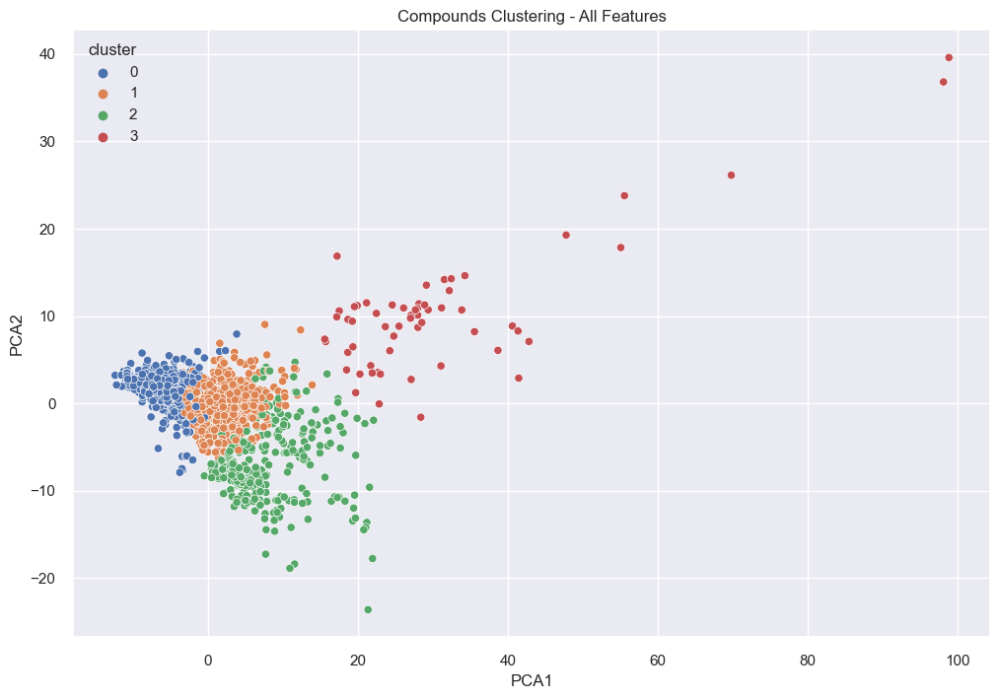

In [41]:
# using pca with 2 components to visualize our scaled data with clusters
components = 2

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_scaled)

# making dataframe for our pca components
pca_df = pd.DataFrame(X_pca, columns=['PCA1','PCA2'])

# adding cluster assignment
pca_df['cluster'] = pd.Categorical(kmean.labels_)

# adding compound name to this dataframe
# pca_df['compound'] = data['Name']

# get the index of the most important feature on EACH component i.e. largest absolute value
most_important = [np.abs(pca.components_[i]).argmax() for i in range(components)]

# columns/ features of our data
initial_feature_names = without_compound.columns

# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(components)]

# using LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i + 1): most_important_names[i] for i in range(components)}

# explained variance
print("Explained variance ratio", pca.explained_variance_ratio_)
print("\nnSum of Explained variance ratio", pca.explained_variance_ratio_.sum())
print("\nColumns chosen by PCA", dic)


pca_df



# Adjust the figure size
plt.figure(figsize=(12, 8))
# Create the scatterplot using Seaborn
sns.scatterplot(data=pca_df, x='PCA1', y='PCA2', hue="cluster")

# Set the plot title
plt.title("Compounds Clustering - All Features")


# Show the plot
plt.show()
# fig = px.scatter(pca_df, x='PCA1', y='PCA2', color="cluster",  title="Compounds Clustering - All Features", width=800)

# fig.show()
# saving the figure in html file
# fig.write_html("cluster4.html")

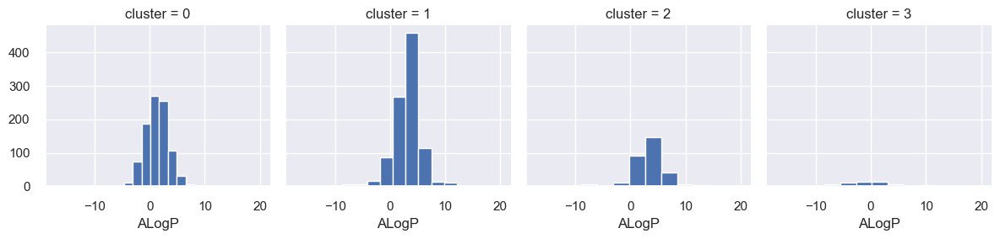

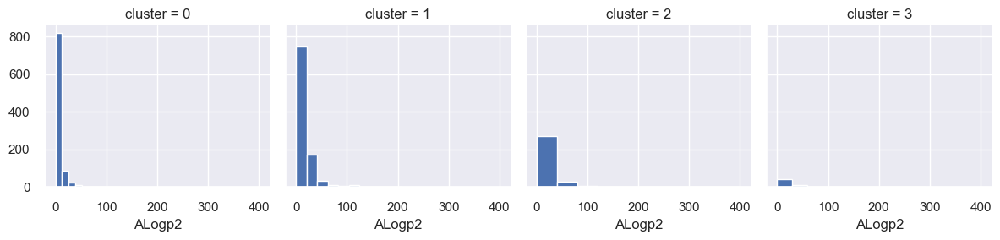

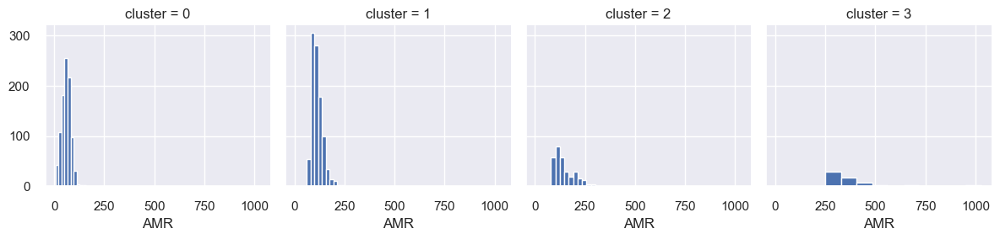

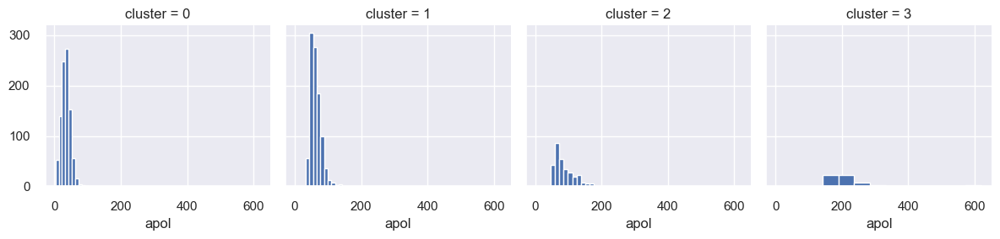

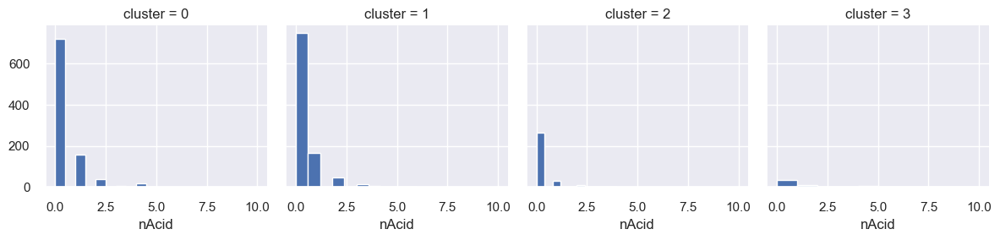

...

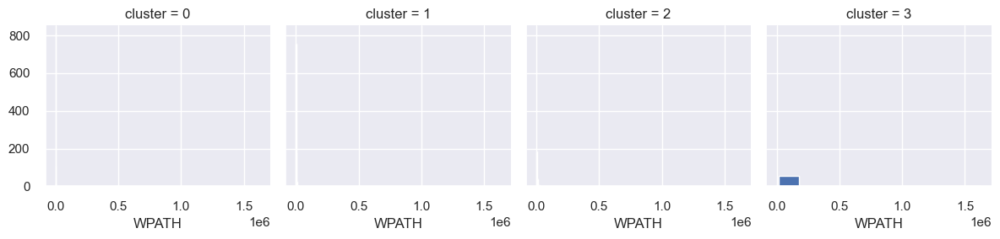

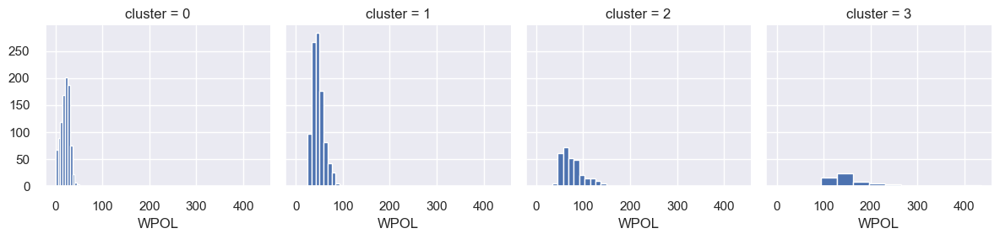

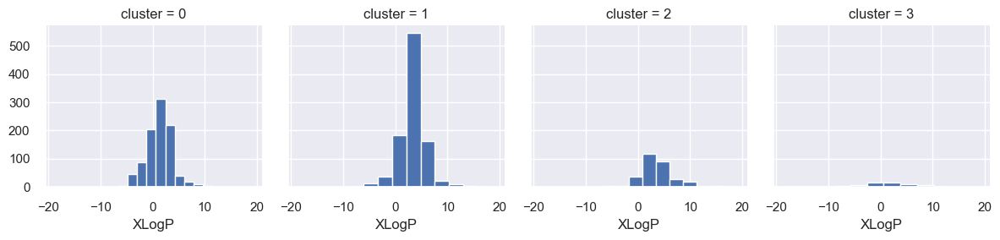

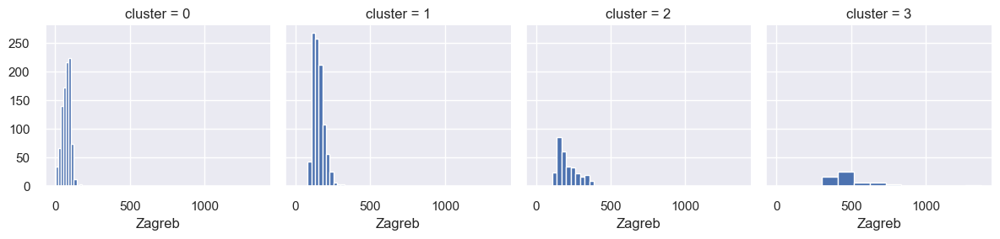

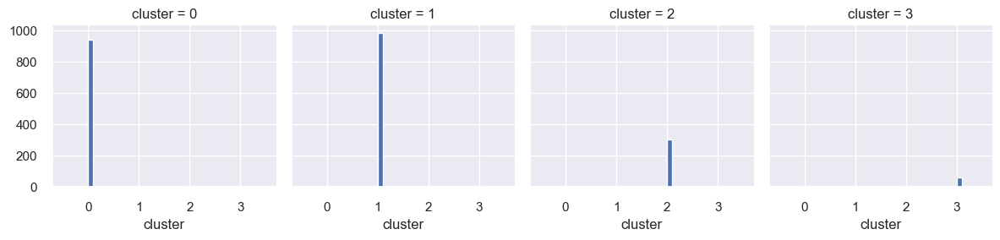

In [42]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(plt.hist, c)

### 99% of Components

In [43]:
# using pca with 2 components to visualize our scaled data with clusters
components = 0.99

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_scaled)
pca.n_components_

82

In [44]:
kmean = KMeans(4, n_init=10, max_iter=1000)
kmean.fit(X_pca)
labels = kmean.labels_

In [45]:
silhouette_score(without_compound, labels)

0.3260162289955886

Explained variance ratio [0.34426944 0.09198149]

nSum of Explained variance ratio 0.43625092682357886

Columns chosen by PCA {'PC1': 'ALogP', 'PC2': 'ALogp2'}


Text(0.5, 1.0, 'Compounds Clustering - All Features')

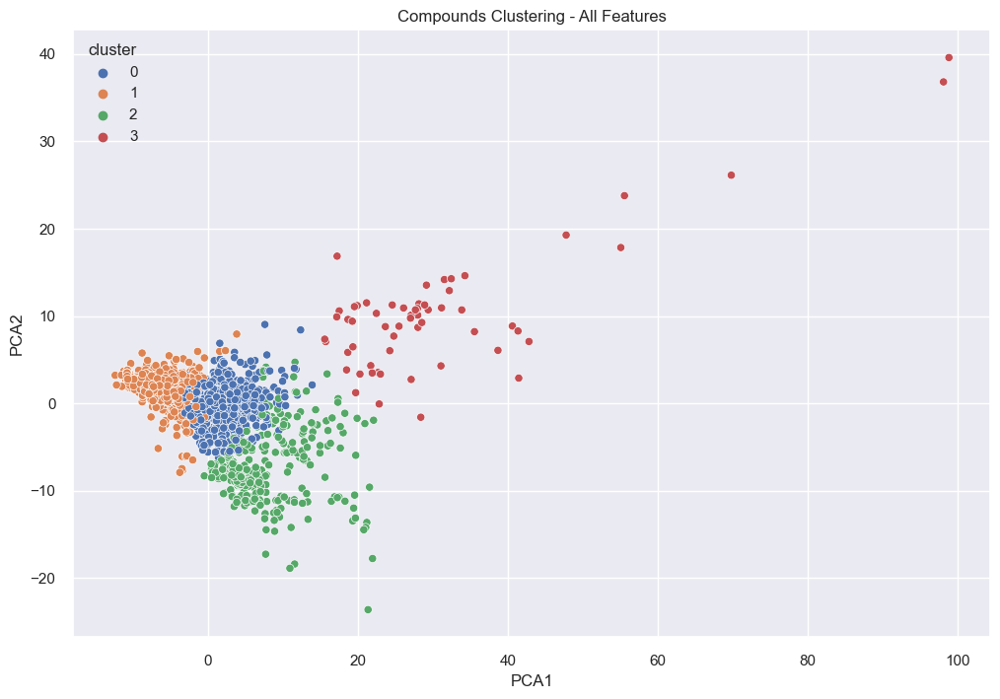

In [46]:
# using pca with 2 components to visualize our scaled data with clusters
components = 2

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_pca)

# making dataframe for our pca components
pca_df = pd.DataFrame(X_pca, columns=['PCA1','PCA2'])

# adding cluster assignment
pca_df['cluster'] = pd.Categorical(kmean.labels_)

# adding compound name to this dataframe
# pca_df['compound'] = data['Name']

# get the index of the most important feature on EACH component i.e. largest absolute value
most_important = [np.abs(pca.components_[i]).argmax() for i in range(components)]

# columns/ features of our data
initial_feature_names = without_compound.columns

# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(components)]

# using LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i + 1): most_important_names[i] for i in range(components)}

# explained variance
print("Explained variance ratio", pca.explained_variance_ratio_)
print("\nnSum of Explained variance ratio", pca.explained_variance_ratio_.sum())
print("\nColumns chosen by PCA", dic)


pca_df
# Adjust the figure size
plt.figure(figsize=(12, 8))
# Create the scatterplot using Seaborn
sns.scatterplot(data=pca_df, x='PCA1', y='PCA2', hue="cluster")

# Set the plot title
plt.title("Compounds Clustering - All Features")


# fig = px.scatter(pca_df, x='PCA1', y='PCA2', color="cluster", title="Compounds Clustering - 99% Components PCA", width=800)

# # saving the figure in html file
# # fig.write_html("cluster4.html")

# fig.show()

In [47]:
# adding clusters to our data
clusters = pd.concat([without_compound, pd.DataFrame({'cluster': labels})], axis=1)
clusters.head(3)

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,cluster
0,-5.0931,25.939668,534.3813,317.363434,6,18,18,293,5.125258,-2.388694,...,306.516036,1.977523,153.543080,82.176355,71.366725,286334.0,230.0,-8.623,752.0,3
1,0.4325,0.187056,317.0896,187.074612,0,20,21,171,2.269431,-1.093604,...,174.200943,2.002310,78.030370,30.548034,47.482336,46759.0,130.0,1.134,436.0,3
2,-1.8743,3.513000,325.6625,190.878612,0,20,21,175,2.635543,-1.251529,...,181.809125,1.997902,88.729976,35.878826,52.851150,52357.0,134.0,-2.012,458.0,3


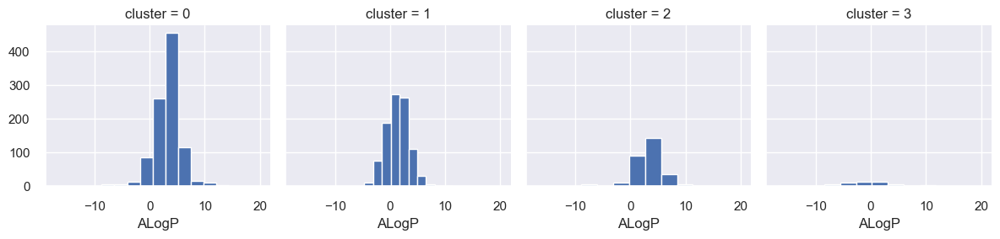

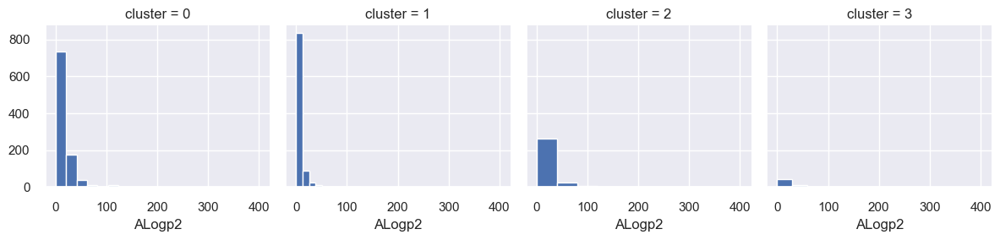

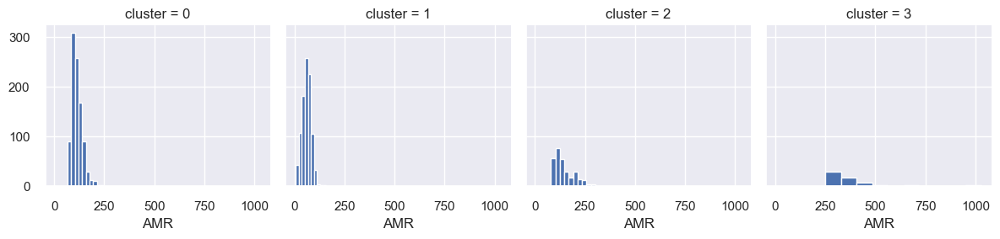

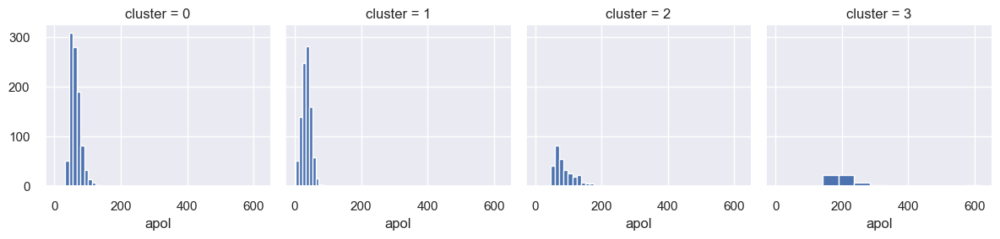

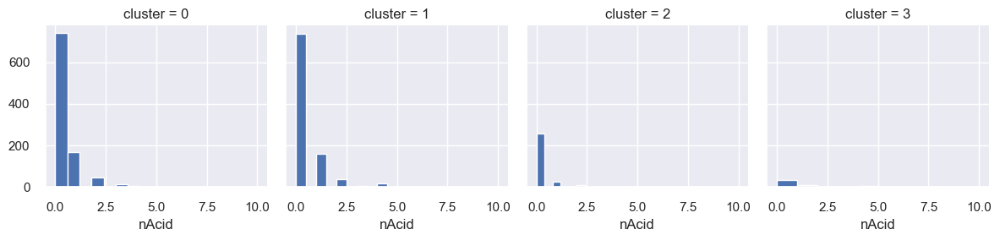

...

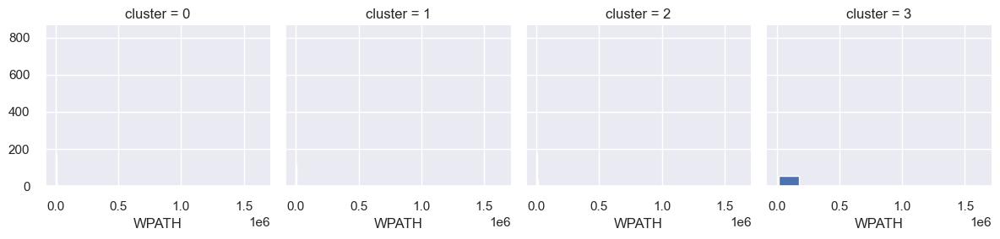

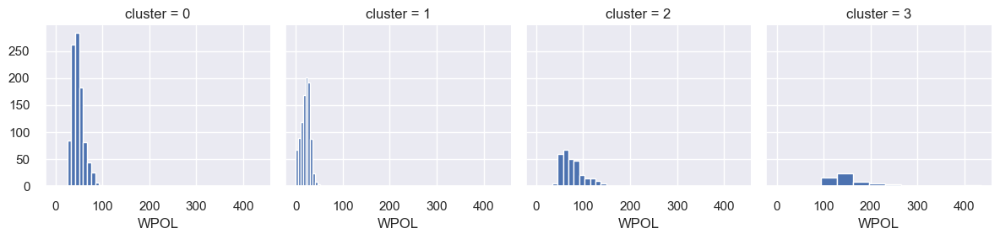

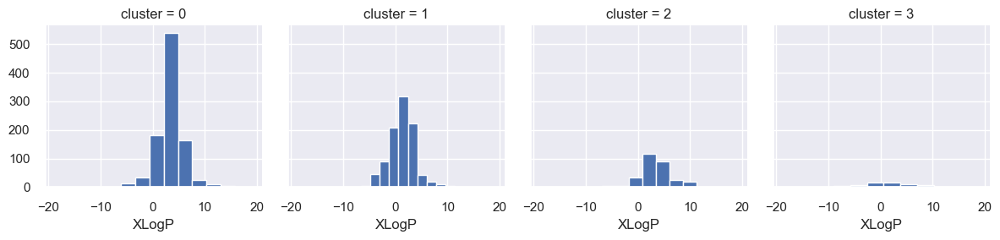

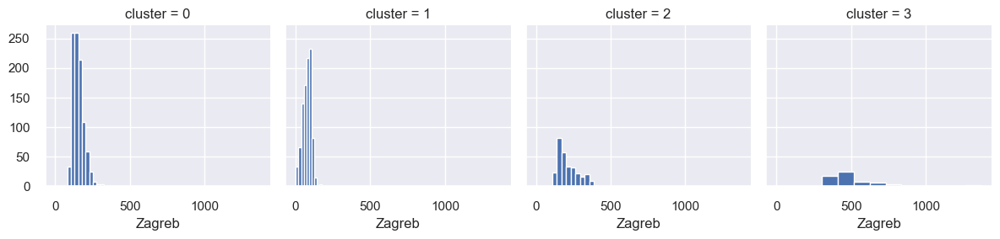

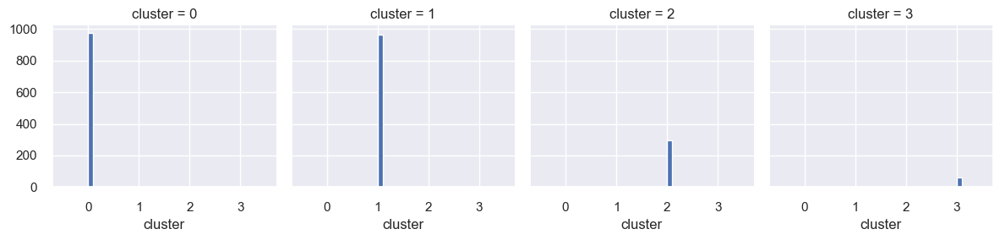

In [48]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(plt.hist, c)

### 2 Components

In [49]:
# using pca with 2 components to visualize our scaled data with clusters
components = 2

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_scaled)
pca.n_components_

2

In [50]:
kmean = KMeans(4, n_init=10, max_iter=1000)
kmean.fit(X_pca)
labels = kmean.labels_

In [51]:
silhouette_score(without_compound, labels)

0.3392598203636521

Explained variance ratio [0.78915463 0.21084537]

nSum of Explained variance ratio 0.9999999999999999

Columns chosen by PCA {'PC1': 'ALogP', 'PC2': 'ALogp2'}


Text(0.5, 1.0, 'Compounds Clustering - All Features')

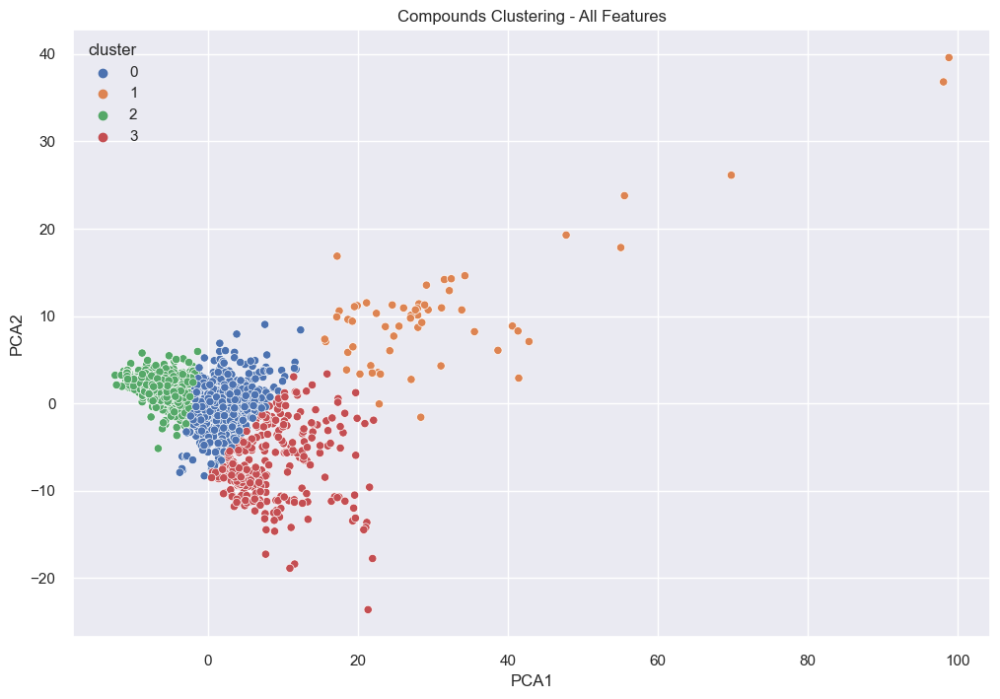

In [52]:
# using pca with 2 components to visualize our scaled data with clusters
components = 2

# initilizing and fitting the pca
pca = PCA(n_components=components)
X_pca = pca.fit_transform(X_pca)

# making dataframe for our pca components
pca_df = pd.DataFrame(X_pca, columns=['PCA1','PCA2'])

# adding cluster assignment
pca_df['cluster'] = pd.Categorical(kmean.labels_)

# adding compound name to this dataframe
# pca_df['compound'] = data['Name']

# get the index of the most important feature on EACH component i.e. largest absolute value
most_important = [np.abs(pca.components_[i]).argmax() for i in range(components)]

# columns/ features of our data
initial_feature_names = without_compound.columns

# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(components)]

# using LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i + 1): most_important_names[i] for i in range(components)}

# explained variance
print("Explained variance ratio", pca.explained_variance_ratio_)
print("\nnSum of Explained variance ratio", pca.explained_variance_ratio_.sum())
print("\nColumns chosen by PCA", dic)


pca_df

# Adjust the figure size
plt.figure(figsize=(12, 8))
# Create the scatterplot using Seaborn
sns.scatterplot(data=pca_df, x='PCA1', y='PCA2', hue="cluster")

# Set the plot title
plt.title("Compounds Clustering - All Features")

# fig = px.scatter(pca_df, x='PCA1', y='PCA2', color="cluster", title="Compounds Clustering - 2 Components PCA", width=800)

# # saving the figure in html file
# # fig.write_html("cluster4.html")

# fig.show()

In [53]:
# adding clusters to our data
clusters = pd.concat([without_compound, pd.DataFrame({'cluster': labels})], axis=1)
clusters.head(3)

,ALogP,ALogp2,AMR,apol,nAcid,naAromAtom,nAromBond,nAtom,ATSc1,ATSc2,...,WTPT-1,WTPT-2,WTPT-3,WTPT-4,WTPT-5,WPATH,WPOL,XLogP,Zagreb,cluster
0,-5.0931,25.939668,534.3813,317.363434,6,18,18,293,5.125258,-2.388694,...,306.516036,1.977523,153.543080,82.176355,71.366725,286334.0,230.0,-8.623,752.0,1
1,0.4325,0.187056,317.0896,187.074612,0,20,21,171,2.269431,-1.093604,...,174.200943,2.002310,78.030370,30.548034,47.482336,46759.0,130.0,1.134,436.0,1
2,-1.8743,3.513000,325.6625,190.878612,0,20,21,175,2.635543,-1.251529,...,181.809125,1.997902,88.729976,35.878826,52.851150,52357.0,134.0,-2.012,458.0,1


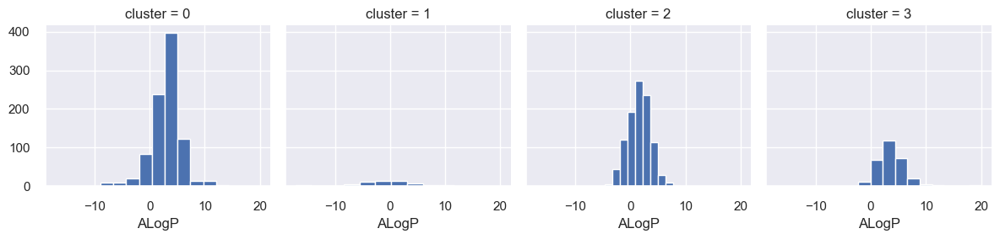

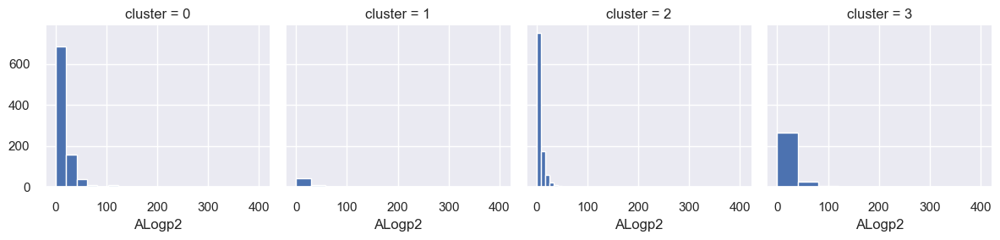

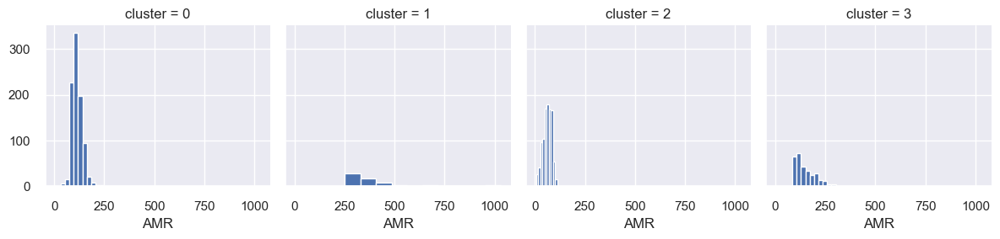

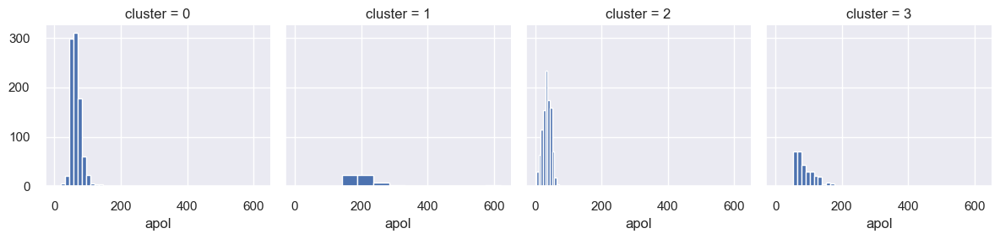

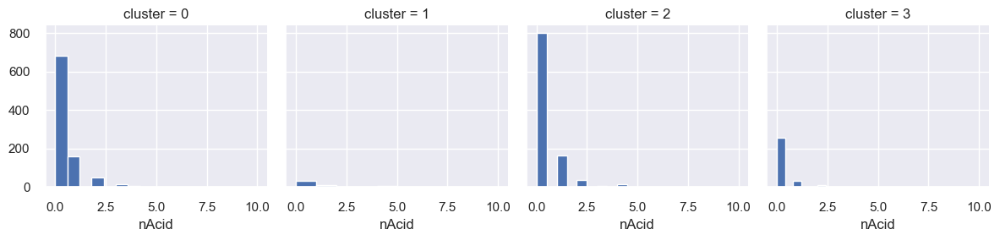

...

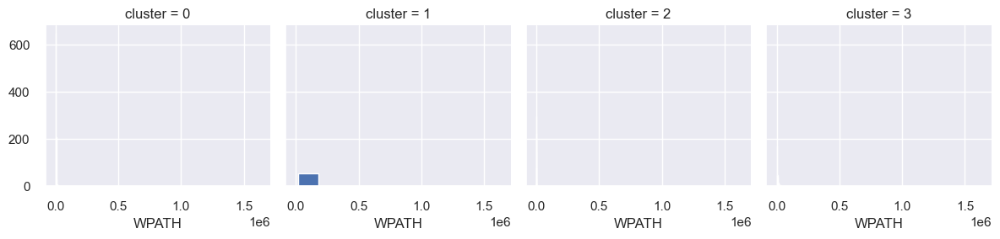

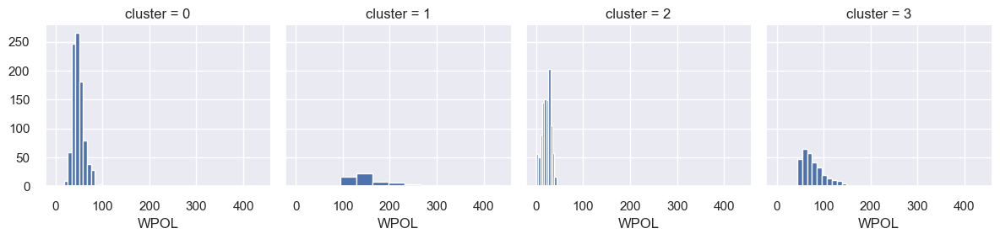

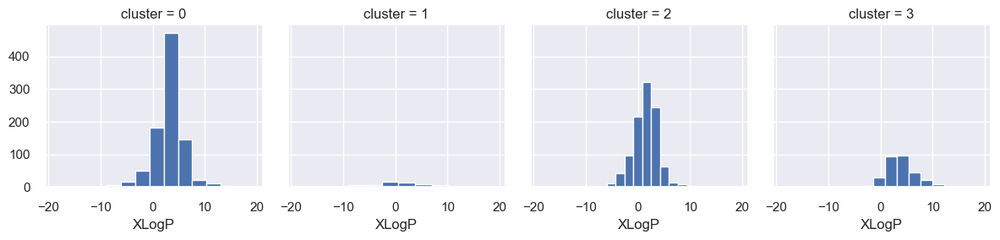

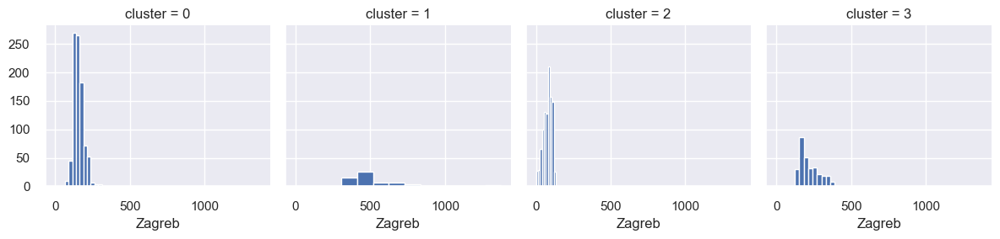

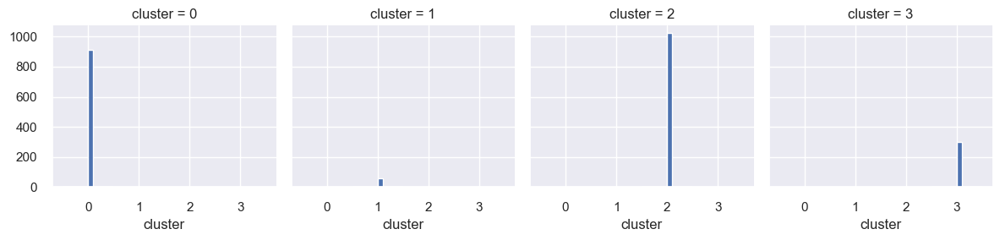

In [54]:
for c in clusters:
    grid = sns.FacetGrid(clusters, col="cluster")
    grid.map(plt.hist, c)

# Interpretation

In [19]:
# for c in clusters:jupyter nbconvert --execute --to html clustering.ipynb

#     grid = sns.FacetGrid(clusters, col="cluster")
#     grid.map(sns.boxplot, c)